In [1]:
!pip install -q medmnist

In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter, defaultdict

from medmnist import INFO
from medmnist import DermaMNIST

import torch
import torch.nn as nn
from torchvision import transforms
from torch.utils.data import DataLoader
from medmnist import DermaMNIST

import importlib
import helpers as h
importlib.reload(h)

Using device: cuda


<module 'helpers' from '/content/helpers.py'>

In [3]:
data_set = "dermamnist"
download = True
IMG_SIZES = (64, 128)
SPLITS = ['train', 'val', 'test']
RESNETS = (18, 50)

info = INFO[data_set]
task = info["task"] 
n_channels = info["n_channels"]
n_classes = len(info["label"])  
class_names = h.get_class_names(info)
print(f"Task: {task}, Channels: {n_channels}, Number of classes: {n_classes}")

datasets = defaultdict(dict)
for size in IMG_SIZES:
    print(f"{size} x {size}")
    for split in SPLITS:
        dataset = DermaMNIST(split=split, download=True, size=size)
        datasets[size][split] = dataset

        print(f"Number of {split} images: {len(dataset)}")

Task: multi-class, Channels: 3, Number of classes: 7
64 x 64
Number of train images: 7007
Number of val images: 1003
Number of test images: 2005
128 x 128
Number of train images: 7007
Number of val images: 1003
Number of test images: 2005


In [4]:
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"Using device: {device}")

Using device: cuda


In [5]:
dfs = []
for size in IMG_SIZES:
    dataset_lst = [datasets[size][split] for split in SPLITS]
    dfs.append(h.count_datasets(dataset_lst, info, n_classes))

for df in dfs:
    display(df)

[train] number of images per class:
-----
actinic keratoses and intraepithelial carcinoma: 228
basal cell carcinoma: 359
benign keratosis-like lesions: 769
dermatofibroma: 80
melanoma: 779
melanocytic nevi: 4693
vascular lesions: 99
-----
[validation] number of images per class:
-----
actinic keratoses and intraepithelial carcinoma: 33
basal cell carcinoma: 52
benign keratosis-like lesions: 110
dermatofibroma: 12
melanoma: 111
melanocytic nevi: 671
vascular lesions: 14
-----
[test] number of images per class:
-----
actinic keratoses and intraepithelial carcinoma: 66
basal cell carcinoma: 103
benign keratosis-like lesions: 220
dermatofibroma: 23
melanoma: 223
melanocytic nevi: 1341
vascular lesions: 29
-----
[total] number and proportions of images per class:
-----
actinic keratoses and intraepithelial carcinoma: 327 (3.27%)
basal cell carcinoma: 514 (5.13%)
benign keratosis-like lesions: 1099 (10.97%)
dermatofibroma: 115 (1.15%)
melanoma: 1113 (11.11%)
melanocytic nevi: 6705 (66.95%)
v

,class,train,validation,test,total,proportion
0,actinic keratoses and intraepithelial carcinoma,228,33,66,327,0.032651
1,basal cell carcinoma,359,52,103,514,0.051323
2,benign keratosis-like lesions,769,110,220,1099,0.109735
3,dermatofibroma,80,12,23,115,0.011483
4,melanoma,779,111,223,1113,0.111133
5,melanocytic nevi,4693,671,1341,6705,0.669496
6,vascular lesions,99,14,29,142,0.014179


,class,train,validation,test,total,proportion
0,actinic keratoses and intraepithelial carcinoma,228,33,66,327,0.032651
1,basal cell carcinoma,359,52,103,514,0.051323
2,benign keratosis-like lesions,769,110,220,1099,0.109735
3,dermatofibroma,80,12,23,115,0.011483
4,melanoma,779,111,223,1113,0.111133
5,melanocytic nevi,4693,671,1341,6705,0.669496
6,vascular lesions,99,14,29,142,0.014179


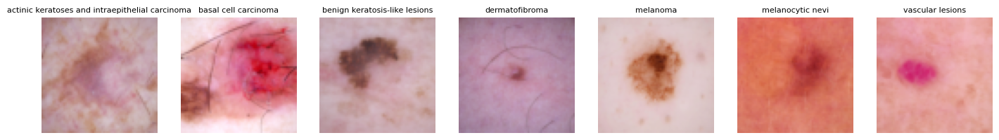

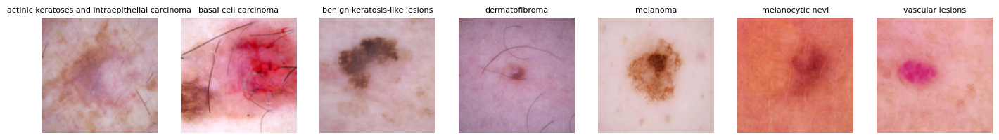

In [6]:
for size in IMG_SIZES:
    h.show_one_per_class(datasets[size]['train'], class_names)

In [7]:
# data imbalanced, nevi dominate with small counts for other classes
# benign classes: nevi, benign keratosis, dermatofibroma, vascular lesions
# malignant classes: melanoma, basal cell carcinoma
# pre-malignant / early stage: actinic keratoses and intraepithelial carcinoma

In [8]:
for size in IMG_SIZES:
    img, label = datasets[size]['train'][0]
    print(np.array(img).shape)
    print(info['n_channels'])

(64, 64, 3)
3
(128, 128, 3)
3


In [9]:
train_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3),
])

test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3),
])

In [10]:
# apply transformations to datasets
datasets_tr = defaultdict(dict)
for size in IMG_SIZES:
    for split in SPLITS:
        datasets_tr[size][split] = DermaMNIST(
            split=split,
            transform=train_transform if split == 'train' else test_transform,   
            download=True,
            size=size
        )

# set up dataloaders
dataloaders = defaultdict(dict)
for size in IMG_SIZES:
    for split in SPLITS:
        dataloaders[size][split] = DataLoader(datasets_tr[size][split], batch_size=64, shuffle=True if split == 'train' else False)

In [11]:
# set up loss function for weighted classes
# since both datasets have same counts of labels, can use same weights
train_labels = [int(label[0]) for _, label in datasets_tr[64]['train']]
class_counts = np.bincount(train_labels)

print("Class counts:", class_counts)

class_weights = 1.0 / torch.tensor(class_counts, dtype=torch.float)
class_weights = class_weights / class_weights.sum() * len(class_counts)

print("Class weights:", class_weights)

weighted_criterion = nn.CrossEntropyLoss(weight=class_weights.to(device))
criterion = nn.CrossEntropyLoss()

criteria = {'unweighted': criterion, 'weighted': weighted_criterion}

Class counts: [ 228  359  769   80  779 4693   99]
Class weights: tensor([0.9426, 0.5987, 0.2795, 2.6865, 0.2759, 0.0458, 2.1709])


In [28]:
out_metrics = defaultdict(list)
for size in IMG_SIZES:
    print(f"{size} x {size}")
    for name, criterion in criteria.items():
        print(f"Loss: {name}")
        for resnet_num in RESNETS:
            print(f"ResNet{resnet_num}")

            resnet = h.get_resnet(resnet_num)
            resnet = h.train_model(resnet, dataloaders[size]['train'], dataloaders[size]['val'], epochs=5, criterion=criterion)

            test_acc = h.evaluate(resnet, dataloaders[size]['test'])
            # print(f"Test accuracy: {test_acc:.4f}")

            val_auc = h.compute_auc(resnet, dataloaders[size]['val'], split='val', size=size)
            test_auc = h.compute_auc(resnet, dataloaders[size]['test'], split='test', size=size)

            out_metrics['img_size'].append(size)
            out_metrics['loss_func'].append(name)
            out_metrics['resnet'].append(f"ResNet{resnet_num}")
            out_metrics['test_acc'].append(test_acc)
            out_metrics['val_auc'].append(val_auc[0])
            out_metrics['val_acc'].append(val_auc[1])
            out_metrics['test_auc'].append(test_auc[0])
            out_metrics['test_acc_2'].append(test_auc[1])
            out_metrics['model_obj'].append(resnet)

out_metrics_df = pd.DataFrame(out_metrics)
display(out_metrics_df)

64 x 64
Loss: unweighted
ResNet18
Epoch 1/5 | Loss: 93.2425 | Val Acc: 0.7627
Epoch 2/5 | Loss: 72.8585 | Val Acc: 0.7408
Epoch 3/5 | Loss: 71.5724 | Val Acc: 0.7607
Epoch 4/5 | Loss: 66.6583 | Val Acc: 0.7926
Epoch 5/5 | Loss: 64.8639 | Val Acc: 0.7866
ResNet50
Epoch 1/5 | Loss: 92.5481 | Val Acc: 0.7567
Epoch 2/5 | Loss: 77.0442 | Val Acc: 0.7557
Epoch 3/5 | Loss: 78.0463 | Val Acc: 0.7149
Epoch 4/5 | Loss: 77.1115 | Val Acc: 0.7557
Epoch 5/5 | Loss: 69.9102 | Val Acc: 0.7807
Loss: weighted
ResNet18
Epoch 1/5 | Loss: 169.7182 | Val Acc: 0.2762
Epoch 2/5 | Loss: 146.5144 | Val Acc: 0.5833
Epoch 3/5 | Loss: 152.0320 | Val Acc: 0.5324
Epoch 4/5 | Loss: 118.4181 | Val Acc: 0.6092
Epoch 5/5 | Loss: 112.9271 | Val Acc: 0.5444
ResNet50
Epoch 1/5 | Loss: 194.7395 | Val Acc: 0.5653
Epoch 2/5 | Loss: 149.0200 | Val Acc: 0.5773
Epoch 3/5 | Loss: 141.9084 | Val Acc: 0.4526
Epoch 4/5 | Loss: 129.8569 | Val Acc: 0.5773
Epoch 5/5 | Loss: 142.6958 | Val Acc: 0.5922
128 x 128
Loss: unweighted
ResNet1

,img_size,loss_func,resnet,test_acc,val_auc,val_acc,test_auc,test_acc_2,model_obj
0,64,unweighted,ResNet18,0.781047,0.945620,0.786640,0.940587,0.781047,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=..."
1,64,unweighted,ResNet50,0.776060,0.934515,0.780658,0.932039,0.776060,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=..."
2,64,weighted,ResNet18,0.569077,0.909820,0.544367,0.916044,0.569077,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=..."
3,64,weighted,ResNet50,0.582045,0.866246,0.592223,0.874318,0.582045,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=..."
4,128,unweighted,ResNet18,0.796010,0.952746,0.794616,0.946784,0.796010,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=..."
5,128,unweighted,ResNet50,0.775062,0.928652,0.791625,0.936434,0.775062,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=..."
6,128,weighted,ResNet18,0.275312,0.827600,0.305085,0.825366,0.275312,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=..."
7,128,weighted,ResNet50,0.621446,0.905400,0.609172,0.904883,0.621446,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=..."


In [ ]:
out_metrics_cbam = defaultdict(list)
learning_rates = (1e-3, 1e-4)
for size in IMG_SIZES:
    print(f"{size} x {size}")
    for name, criterion in criteria.items():
        print(f"Loss: {name}")
        for resnet_num in RESNETS:
            print(f"ResNet{resnet}")
            for lr in learning_rates:
                print(f"LR: {lr}")

                resnet_cbam = h.ResNet_CBAM(f"resnet{resnet_num}", n_classes).to(device)
                resnet_cbam = h.train_model(resnet_cbam, dataloaders[size]['train'], dataloaders[size]['val'], epochs=5, criterion=criterion, lr=lr)

                test_acc_cbam = h.evaluate(resnet_cbam, dataloaders[size]['test'])

                val_auc_cbam = h.compute_auc(resnet_cbam, dataloaders[size]['val'], split='val', size=size)
                test_auc_cbam = h.compute_auc(resnet_cbam, dataloaders[size]['test'], split='test', size=size)

                out_metrics_cbam['img_size'].append(size)
                out_metrics_cbam['loss_func'].append(name)
                out_metrics_cbam['resnet'].append(f"ResNet{resnet_num}")
                out_metrics_cbam['learning_rate'].append(lr)
                out_metrics_cbam['test_acc'].append(test_acc)
                out_metrics_cbam['val_auc'].append(val_auc[0])
                out_metrics_cbam['val_acc'].append(val_auc[1])
                out_metrics_cbam['test_auc'].append(test_auc[0])
                out_metrics_cbam['test_acc_2'].append(test_auc[1])
                out_metrics_cbam['model_obj'].append(resnet_cbam)

out_metrics_cbam = pd.DataFrame(out_metrics_cbam)
display(out_metrics_cbam)

64 x 64
Loss: unweighted
ResNet18
LR: 0.001


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/5 | Loss: 92.4428 | Val Acc: 0.7119
Epoch 2/5 | Loss: 74.8520 | Val Acc: 0.7308
Epoch 3/5 | Loss: 74.4218 | Val Acc: 0.7797
Epoch 4/5 | Loss: 69.2387 | Val Acc: 0.7747
Epoch 5/5 | Loss: 66.8064 | Val Acc: 0.7567
LR: 0.0001


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/5 | Loss: 96.0979 | Val Acc: 0.7507
Epoch 2/5 | Loss: 71.8946 | Val Acc: 0.7727
Epoch 3/5 | Loss: 63.5330 | Val Acc: 0.7807
Epoch 4/5 | Loss: 58.0953 | Val Acc: 0.8066
Epoch 5/5 | Loss: 53.1996 | Val Acc: 0.7906
ResNet50
LR: 0.001


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/5 | Loss: 95.8123 | Val Acc: 0.7348
Epoch 2/5 | Loss: 83.5447 | Val Acc: 0.7637
Epoch 3/5 | Loss: 72.5455 | Val Acc: 0.7747
Epoch 4/5 | Loss: 70.4014 | Val Acc: 0.7916
Epoch 5/5 | Loss: 74.6484 | Val Acc: 0.7717
LR: 0.0001


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/5 | Loss: 90.8992 | Val Acc: 0.7657
Epoch 2/5 | Loss: 64.8560 | Val Acc: 0.7876
Epoch 3/5 | Loss: 56.6321 | Val Acc: 0.7836
Epoch 4/5 | Loss: 49.8077 | Val Acc: 0.7946
Epoch 5/5 | Loss: 44.8835 | Val Acc: 0.8086
Loss: weighted
ResNet18
LR: 0.001


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/5 | Loss: 180.0803 | Val Acc: 0.5384
Epoch 2/5 | Loss: 140.0566 | Val Acc: 0.5494
Epoch 3/5 | Loss: 128.1571 | Val Acc: 0.6052
Epoch 4/5 | Loss: 117.5028 | Val Acc: 0.5523
Epoch 5/5 | Loss: 109.2397 | Val Acc: 0.5194
LR: 0.0001


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/5 | Loss: 166.3047 | Val Acc: 0.5234
Epoch 2/5 | Loss: 119.5852 | Val Acc: 0.6451
Epoch 3/5 | Loss: 98.9666 | Val Acc: 0.6670
Epoch 4/5 | Loss: 90.4600 | Val Acc: 0.6660
Epoch 5/5 | Loss: 79.7957 | Val Acc: 0.6710
ResNet50
LR: 0.001


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/5 | Loss: 186.7955 | Val Acc: 0.4656
Epoch 2/5 | Loss: 139.4748 | Val Acc: 0.6261
Epoch 3/5 | Loss: 138.2278 | Val Acc: 0.5962
Epoch 4/5 | Loss: 143.1111 | Val Acc: 0.5653
Epoch 5/5 | Loss: 151.3770 | Val Acc: 0.6281
LR: 0.0001


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/5 | Loss: 152.2542 | Val Acc: 0.6700
Epoch 2/5 | Loss: 108.5637 | Val Acc: 0.6152
Epoch 3/5 | Loss: 90.1426 | Val Acc: 0.6351
Epoch 4/5 | Loss: 82.5136 | Val Acc: 0.6690
Epoch 5/5 | Loss: 73.2302 | Val Acc: 0.6610
128 x 128
Loss: unweighted
ResNet18
LR: 0.001


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/5 | Loss: 91.6296 | Val Acc: 0.7139
Epoch 2/5 | Loss: 74.0987 | Val Acc: 0.7388
Epoch 3/5 | Loss: 69.1009 | Val Acc: 0.7687
Epoch 4/5 | Loss: 64.8059 | Val Acc: 0.7567
Epoch 5/5 | Loss: 62.0345 | Val Acc: 0.7886
LR: 0.0001


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/5 | Loss: 89.7442 | Val Acc: 0.7707
Epoch 2/5 | Loss: 58.2112 | Val Acc: 0.8066
Epoch 3/5 | Loss: 49.4665 | Val Acc: 0.8185
Epoch 4/5 | Loss: 43.0429 | Val Acc: 0.8146
Epoch 5/5 | Loss: 37.3174 | Val Acc: 0.8295
ResNet50
LR: 0.001


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/5 | Loss: 98.3241 | Val Acc: 0.6989
Epoch 2/5 | Loss: 81.1780 | Val Acc: 0.7318
Epoch 3/5 | Loss: 76.2395 | Val Acc: 0.7687
Epoch 4/5 | Loss: 73.6406 | Val Acc: 0.7547
Epoch 5/5 | Loss: 68.4158 | Val Acc: 0.7657
LR: 0.0001


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/5 | Loss: 80.1866 | Val Acc: 0.8126
Epoch 2/5 | Loss: 54.7859 | Val Acc: 0.8215
Epoch 3/5 | Loss: 46.5157 | Val Acc: 0.8345
Epoch 4/5 | Loss: 37.6849 | Val Acc: 0.8315
Epoch 5/5 | Loss: 34.0367 | Val Acc: 0.8405
Loss: weighted
ResNet18
LR: 0.001


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/5 | Loss: 168.7518 | Val Acc: 0.3948
Epoch 2/5 | Loss: 155.6986 | Val Acc: 0.5404
Epoch 3/5 | Loss: 127.4309 | Val Acc: 0.5862
Epoch 4/5 | Loss: 115.0255 | Val Acc: 0.4975
Epoch 5/5 | Loss: 114.6340 | Val Acc: 0.4746
LR: 0.0001


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/5 | Loss: 142.0557 | Val Acc: 0.6012
Epoch 2/5 | Loss: 92.5168 | Val Acc: 0.5992
Epoch 3/5 | Loss: 77.7053 | Val Acc: 0.7358
Epoch 4/5 | Loss: 65.8617 | Val Acc: 0.7208
Epoch 5/5 | Loss: 54.0680 | Val Acc: 0.7318
ResNet50
LR: 0.001


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/5 | Loss: 184.2645 | Val Acc: 0.4726
Epoch 2/5 | Loss: 149.3005 | Val Acc: 0.5693
Epoch 3/5 | Loss: 144.1735 | Val Acc: 0.5623
Epoch 4/5 | Loss: 132.0457 | Val Acc: 0.4467
Epoch 5/5 | Loss: 126.1774 | Val Acc: 0.6221
LR: 0.0001


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/5 | Loss: 129.7677 | Val Acc: 0.6869
Epoch 2/5 | Loss: 88.0648 | Val Acc: 0.6401
Epoch 3/5 | Loss: 75.8073 | Val Acc: 0.6570
Epoch 4/5 | Loss: 65.6424 | Val Acc: 0.7308
Epoch 5/5 | Loss: 51.8585 | Val Acc: 0.7129


,img_size,loss_func,resnet,learning_rate,test_acc,val_auc,val_acc,test_auc,test_auc_2,model_obj
0,64,unweighted,ResNet18,0.0010,0.535162,0.858652,0.536391,0.878342,0.535162,ResNet_CBAM(\n (backbone): ResNet(\n (conv...
1,64,unweighted,ResNet18,0.0001,0.535162,0.858652,0.536391,0.878342,0.535162,ResNet_CBAM(\n (backbone): ResNet(\n (conv...
2,64,unweighted,ResNet50,0.0010,0.535162,0.858652,0.536391,0.878342,0.535162,ResNet_CBAM(\n (backbone): ResNet(\n (conv...
3,64,unweighted,ResNet50,0.0001,0.535162,0.858652,0.536391,0.878342,0.535162,ResNet_CBAM(\n (backbone): ResNet(\n (conv...
4,64,weighted,ResNet18,0.0010,0.535162,0.858652,0.536391,0.878342,0.535162,ResNet_CBAM(\n (backbone): ResNet(\n (conv...
5,64,weighted,ResNet18,0.0001,0.535162,0.858652,0.536391,0.878342,0.535162,ResNet_CBAM(\n (backbone): ResNet(\n (conv...
6,64,weighted,ResNet50,0.0010,0.535162,0.858652,0.536391,0.878342,0.535162,ResNet_CBAM(\n (backbone): ResNet(\n (conv...
7,64,weighted,ResNet50,0.0001,0.535162,0.858652,0.536391,0.878342,0.535162,ResNet_CBAM(\n (backbone): ResNet(\n (conv...
8,128,unweighted,ResNet18,0.0010,0.535162,0.858652,0.536391,0.878342,0.535162,ResNet_CBAM(\n (backbone): ResNet(\n (conv...
9,128,unweighted,ResNet18,0.0001,0.535162,0.858652,0.536391,0.878342,0.535162,ResNet_CBAM(\n (backbone): ResNet(\n (conv...


In [29]:
# AI Usage: asked AI how to save the model
from pathlib import Path
all_results = pd.concat([out_metrics_df, out_metrics_cbam], axis=0)
display(all_results)

,img_size,loss_func,resnet,test_acc,val_auc,val_acc,test_auc,test_acc_2,model_obj,learning_rate
0,64,unweighted,ResNet18,0.781047,0.945620,0.786640,0.940587,0.781047,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=...",NaN
1,64,unweighted,ResNet50,0.776060,0.934515,0.780658,0.932039,0.776060,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=...",NaN
2,64,weighted,ResNet18,0.569077,0.909820,0.544367,0.916044,0.569077,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=...",NaN
3,64,weighted,ResNet50,0.582045,0.866246,0.592223,0.874318,0.582045,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=...",NaN
4,128,unweighted,ResNet18,0.796010,0.952746,0.794616,0.946784,0.796010,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=...",NaN
5,128,unweighted,ResNet50,0.775062,0.928652,0.791625,0.936434,0.775062,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=...",NaN
6,128,weighted,ResNet18,0.275312,0.827600,0.305085,0.825366,0.275312,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=...",NaN
7,128,weighted,ResNet50,0.621446,0.905400,0.609172,0.904883,0.621446,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=...",NaN
0,64,unweighted,ResNet18,0.535162,0.858652,0.536391,0.878342,0.535162,ResNet_CBAM(\n (backbone): ResNet(\n (conv...,0.0010
1,64,unweighted,ResNet18,0.535162,0.858652,0.536391,0.878342,0.535162,ResNet_CBAM(\n (backbone): ResNet(\n (conv...,0.0001


It looks like 128 x 128 ResNet 18 unweighted has the highest AUC and accuracy.

In [30]:
model_dir = Path.cwd() / 'models'
model_dir.mkdir(parents=True, exist_ok=True)

for row in all_results.itertuples():
    filename = f"{row.img_size}_{row.loss_func}_{row.resnet}_{row.learning_rate}_model.pth"
    torch.save(row.model_obj.state_dict(), model_dir / filename)

all_results.drop('model_obj', axis=1, errors='raise').to_csv("all_results.csv")

64_unweighted_ResNet18_nan_model.pth
64_unweighted_ResNet50_nan_model.pth
64_weighted_ResNet18_nan_model.pth
64_weighted_ResNet50_nan_model.pth
128_unweighted_ResNet18_nan_model.pth
128_unweighted_ResNet50_nan_model.pth
128_weighted_ResNet18_nan_model.pth
128_weighted_ResNet50_nan_model.pth
64_unweighted_ResNet18_0.001_model.pth
64_unweighted_ResNet18_0.0001_model.pth
64_unweighted_ResNet50_0.001_model.pth
64_unweighted_ResNet50_0.0001_model.pth
64_weighted_ResNet18_0.001_model.pth
64_weighted_ResNet18_0.0001_model.pth
64_weighted_ResNet50_0.001_model.pth
64_weighted_ResNet50_0.0001_model.pth
128_unweighted_ResNet18_0.001_model.pth
128_unweighted_ResNet18_0.0001_model.pth
128_unweighted_ResNet50_0.001_model.pth
128_unweighted_ResNet50_0.0001_model.pth
128_weighted_ResNet18_0.001_model.pth
128_weighted_ResNet18_0.0001_model.pth
128_weighted_ResNet50_0.001_model.pth
128_weighted_ResNet50_0.0001_model.pth


In [17]:
!pip install -q grad-cam

64, unweighted, ResNet18, nan


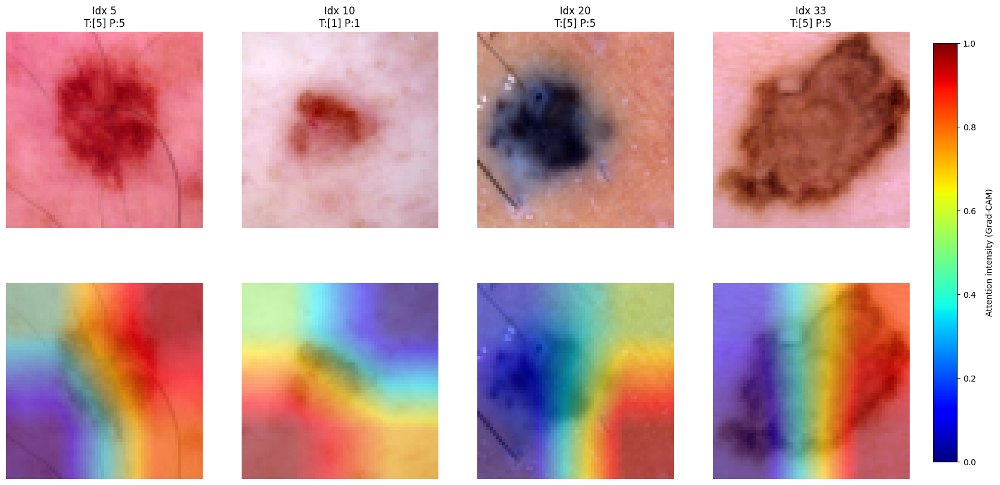

64, unweighted, ResNet50, nan


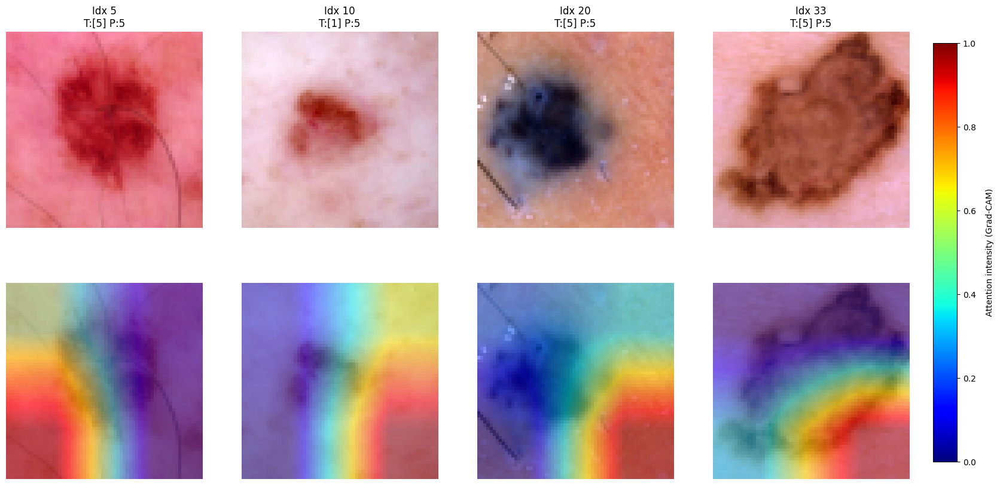

64, weighted, ResNet18, nan


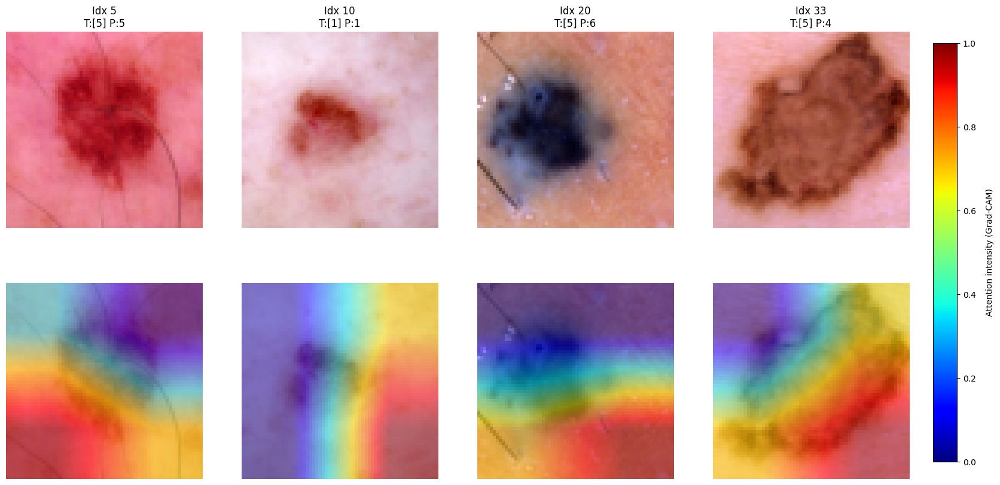

64, weighted, ResNet50, nan


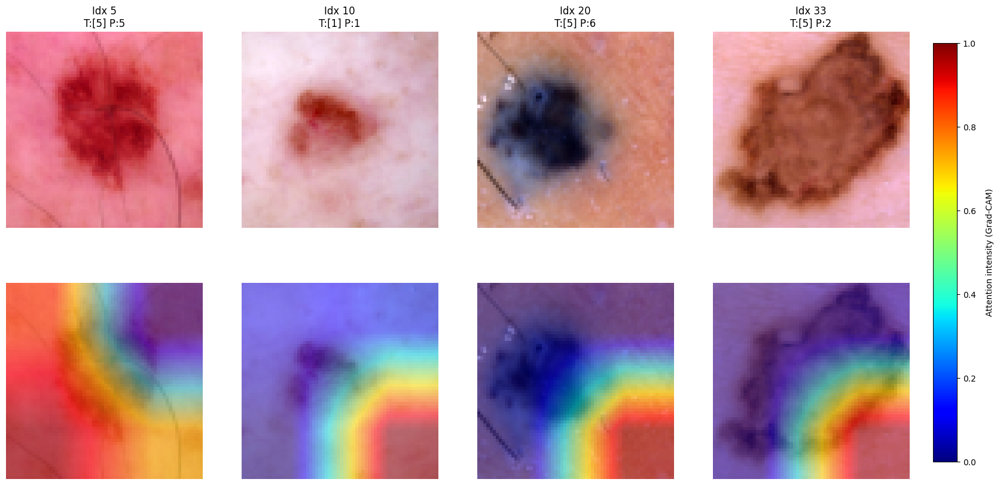

128, unweighted, ResNet18, nan


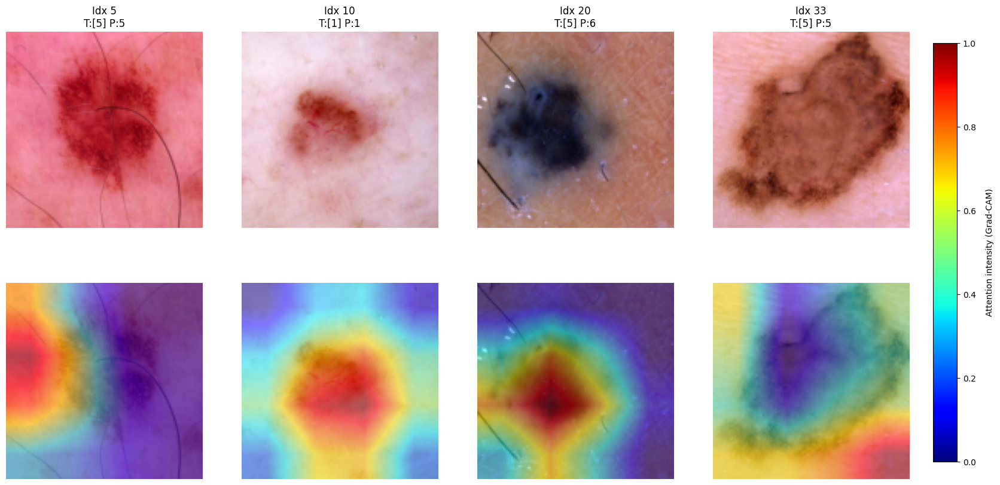

128, unweighted, ResNet50, nan


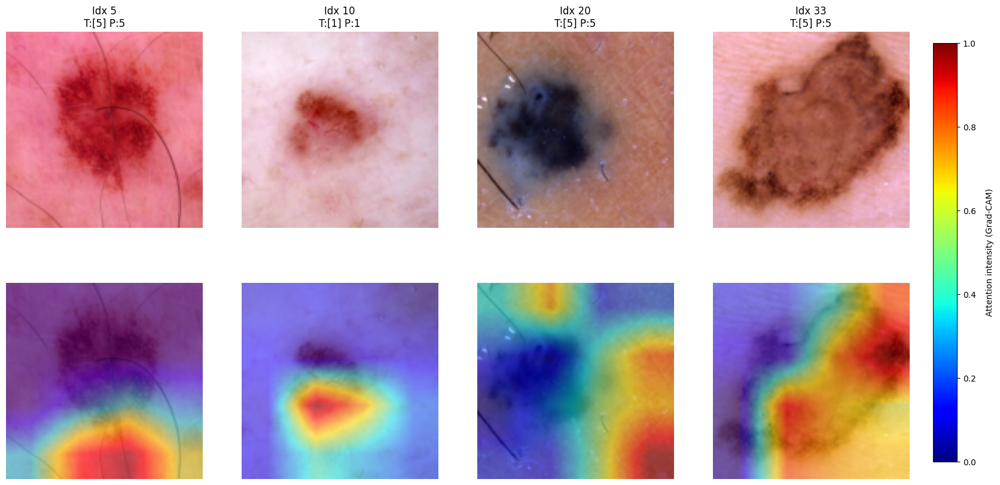

128, weighted, ResNet18, nan


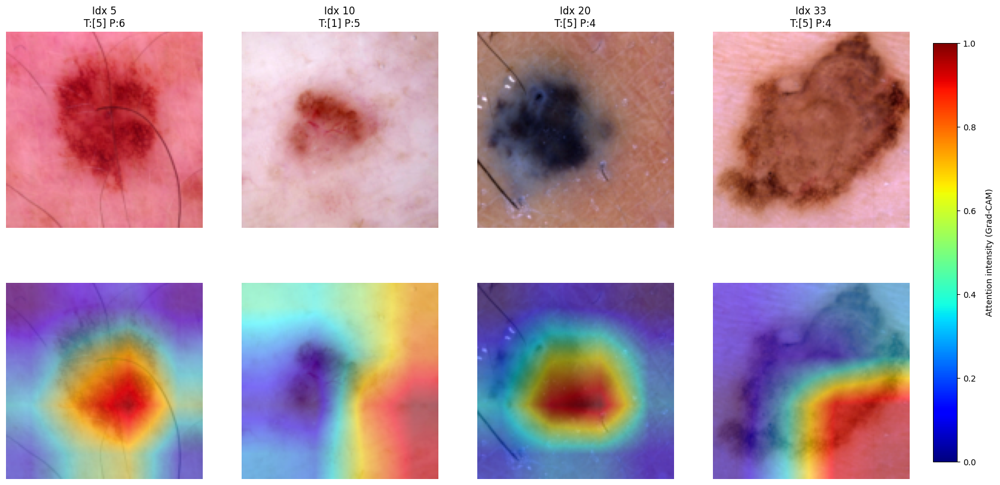

128, weighted, ResNet50, nan


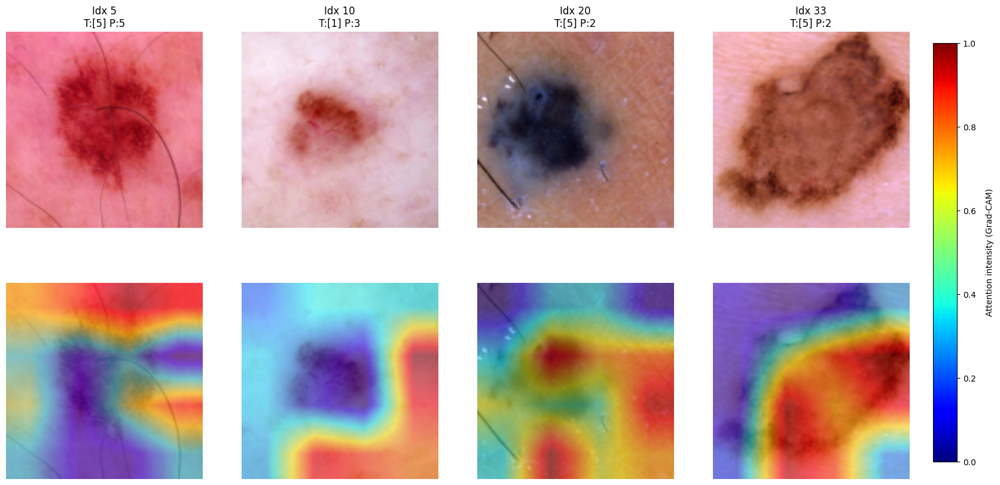

64, unweighted, ResNet18, 0.001


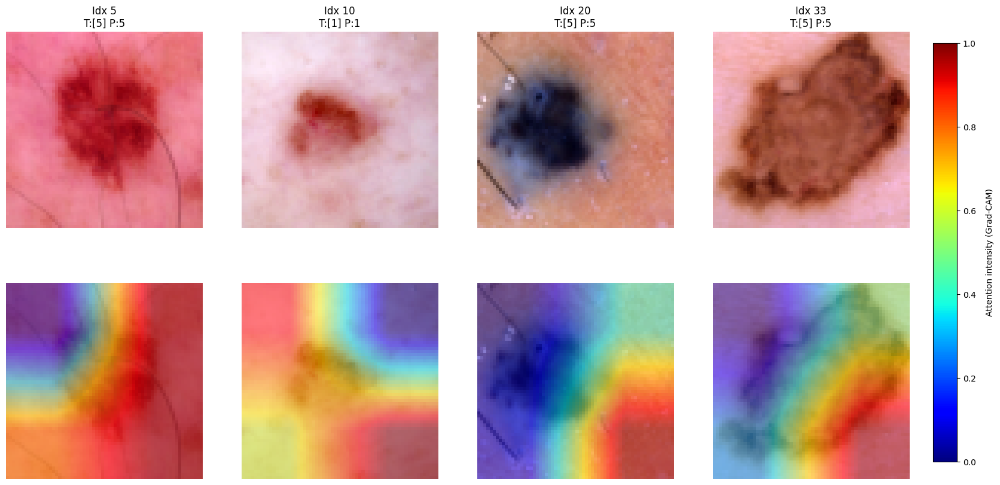

64, unweighted, ResNet18, 0.0001


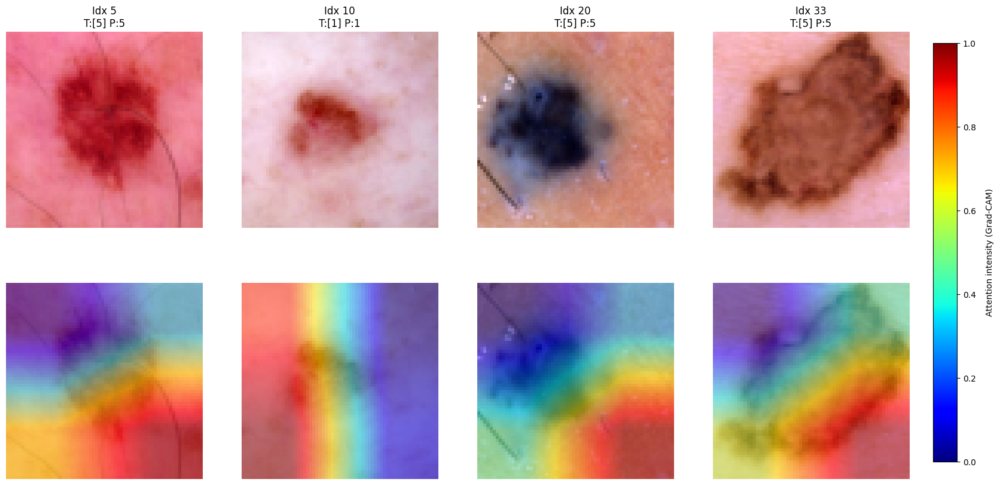

64, unweighted, ResNet50, 0.001


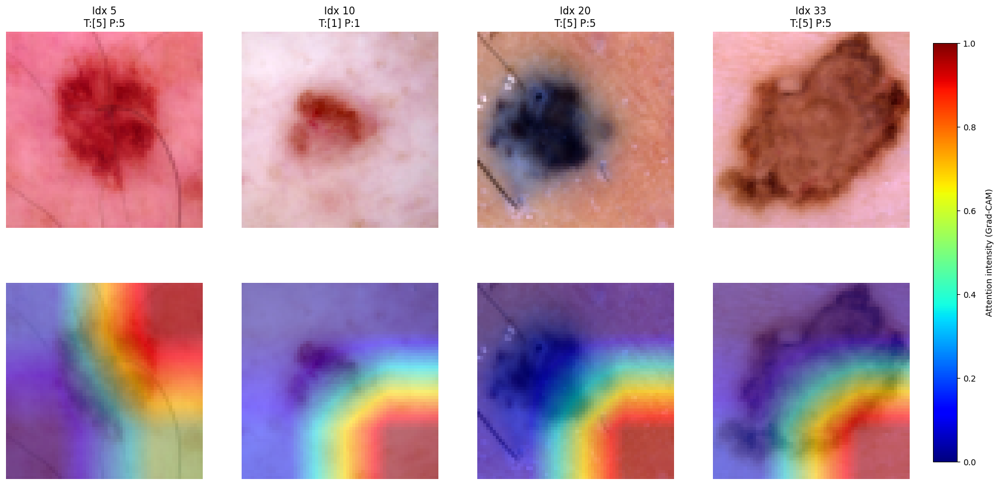

64, unweighted, ResNet50, 0.0001


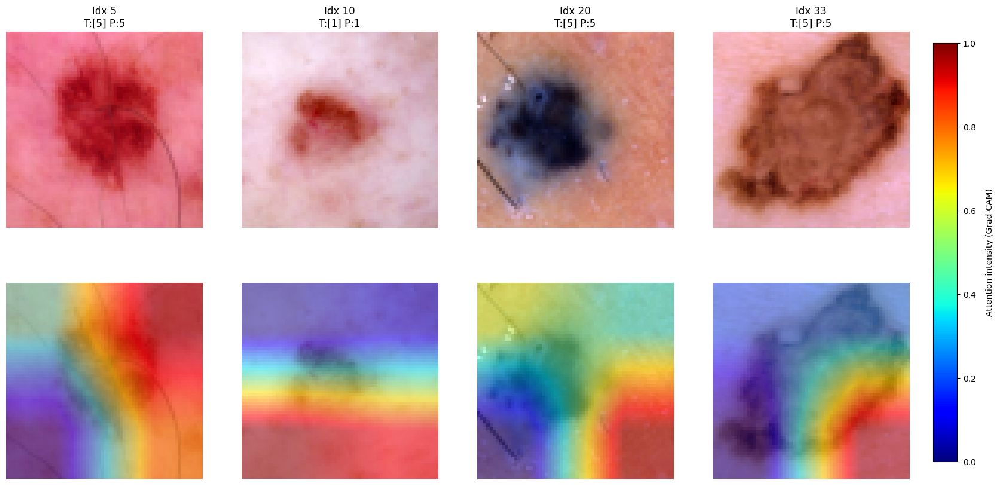

64, weighted, ResNet18, 0.001


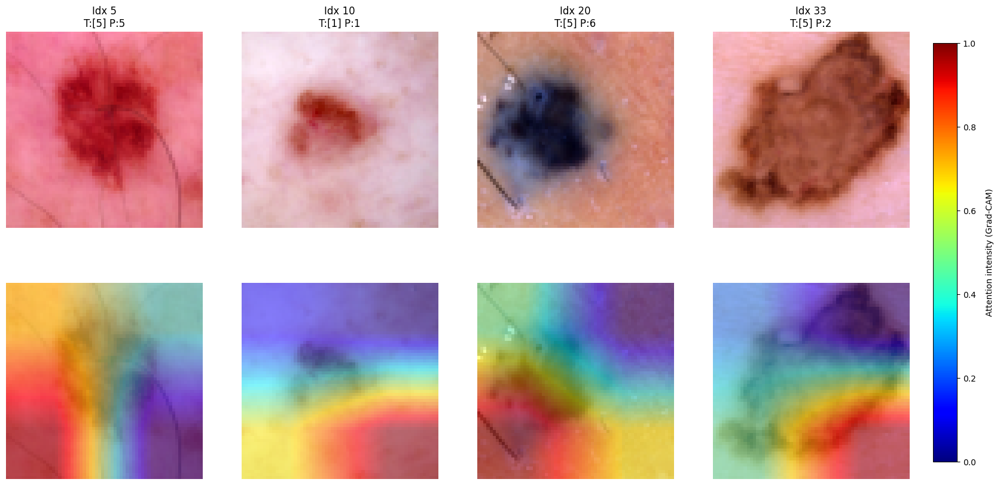

64, weighted, ResNet18, 0.0001


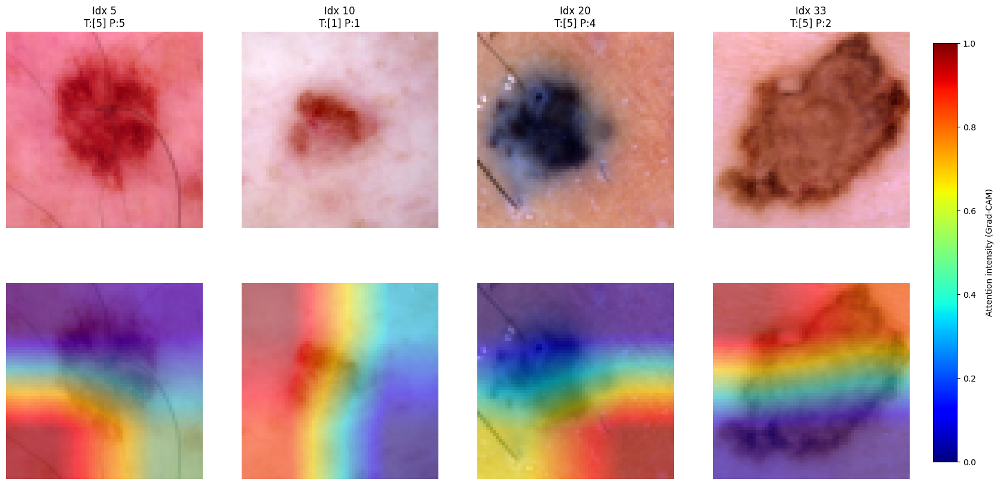

64, weighted, ResNet50, 0.001


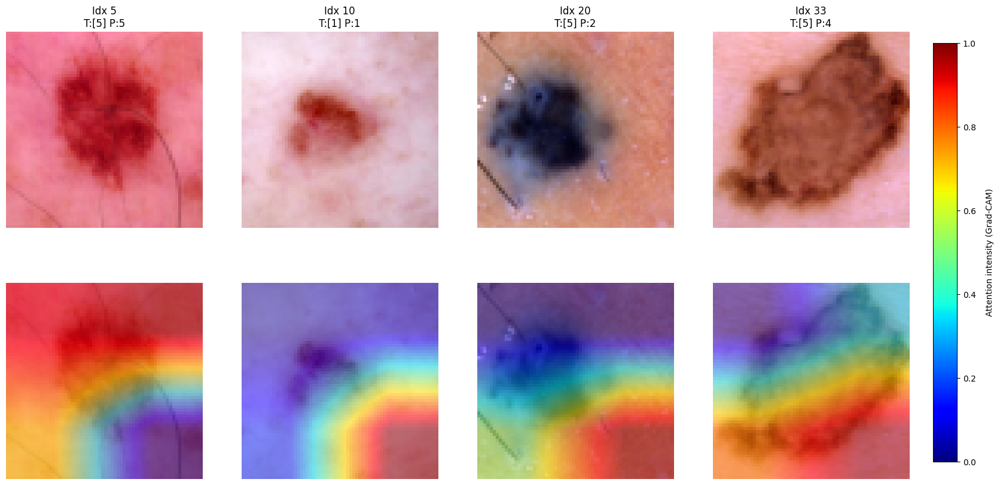

64, weighted, ResNet50, 0.0001


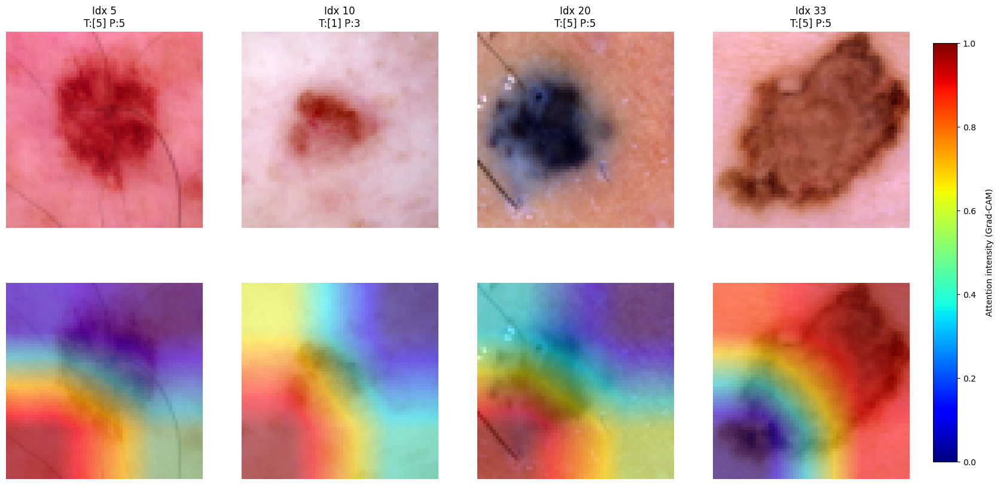

128, unweighted, ResNet18, 0.001


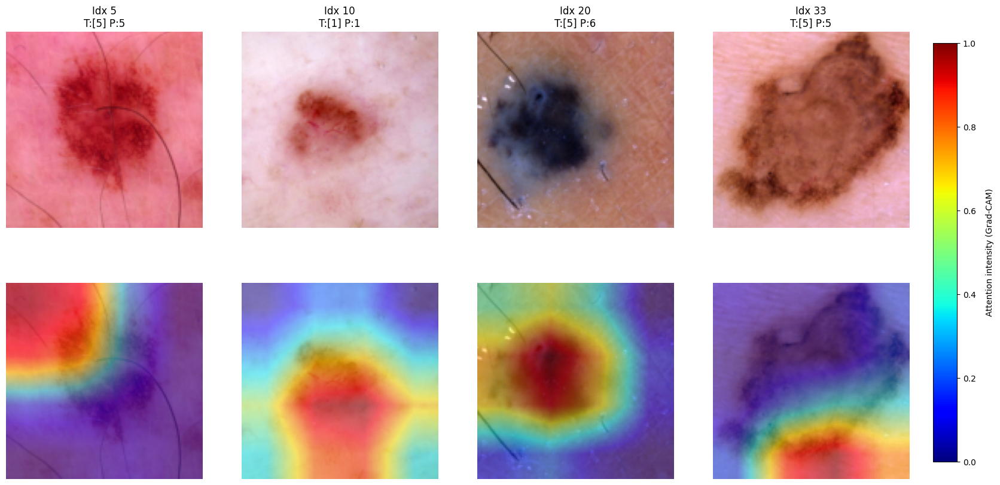

128, unweighted, ResNet18, 0.0001


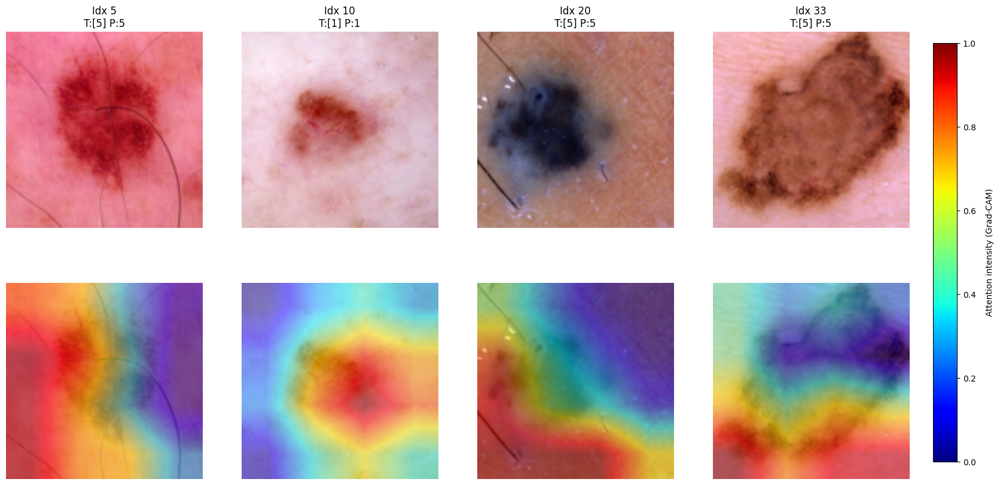

128, unweighted, ResNet50, 0.001


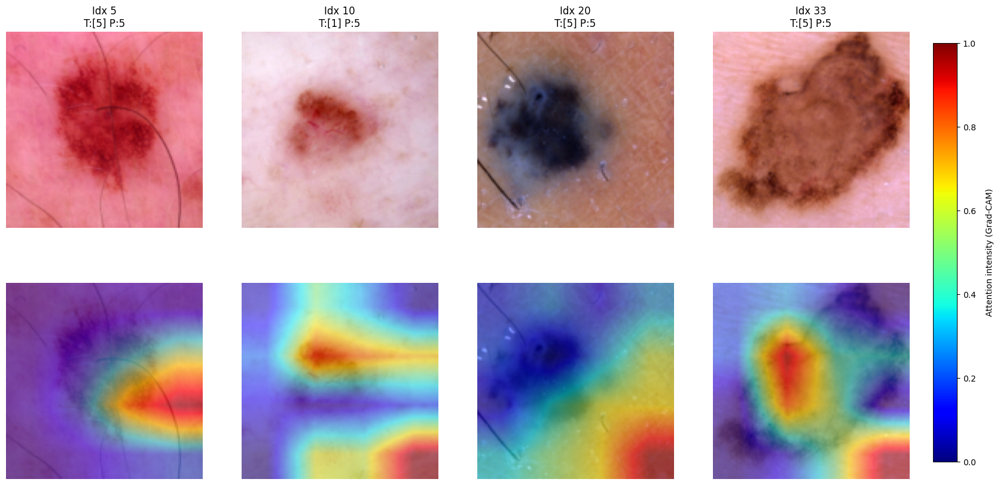

128, unweighted, ResNet50, 0.0001


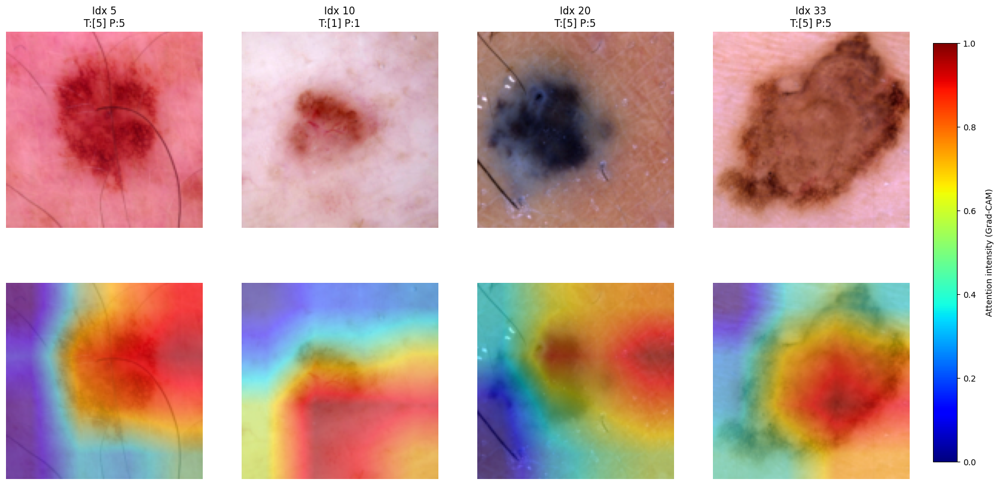

128, weighted, ResNet18, 0.001


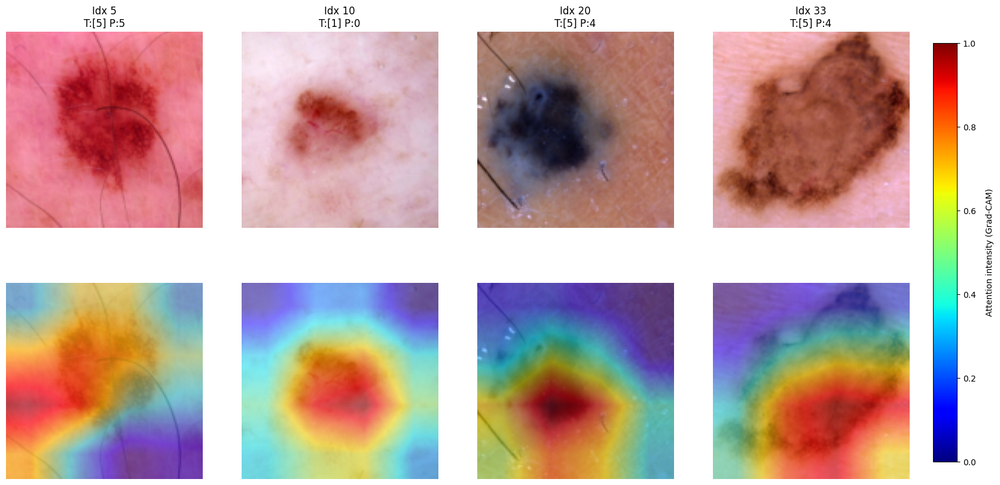

128, weighted, ResNet18, 0.0001


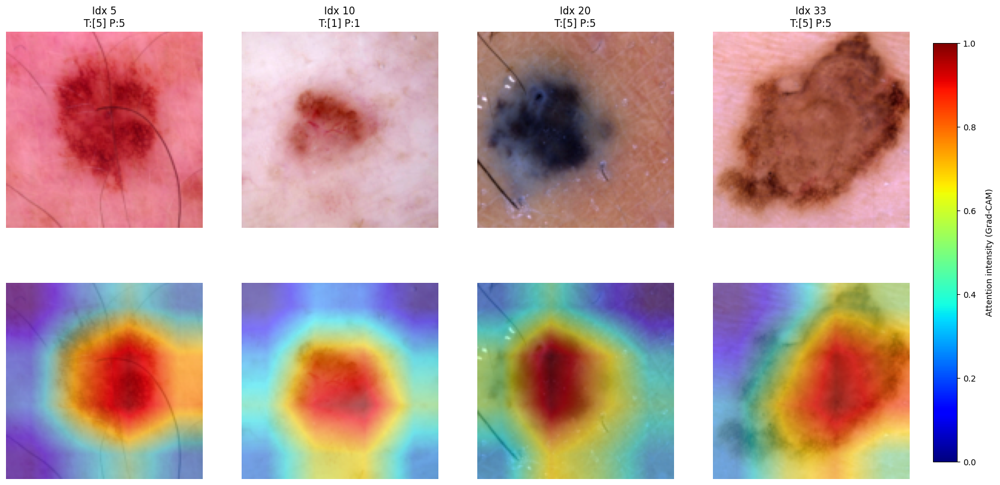

128, weighted, ResNet50, 0.001


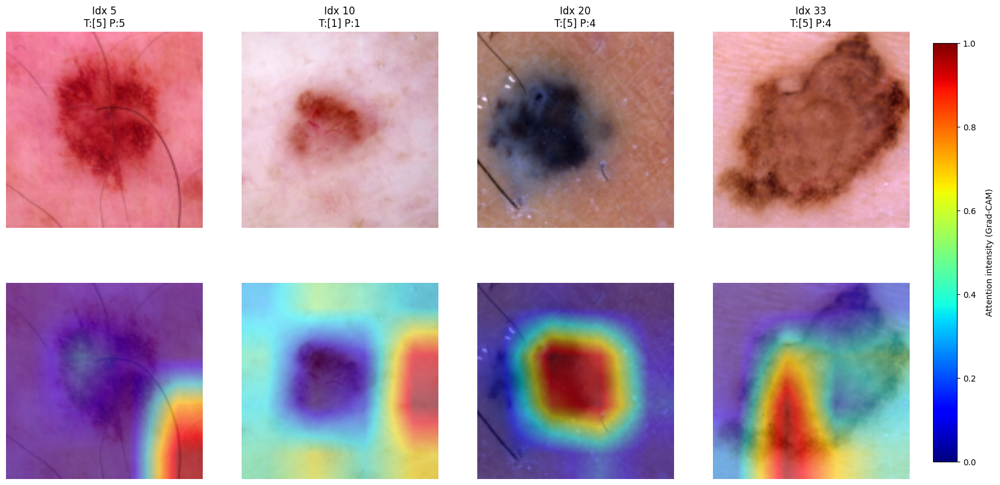

128, weighted, ResNet50, 0.0001


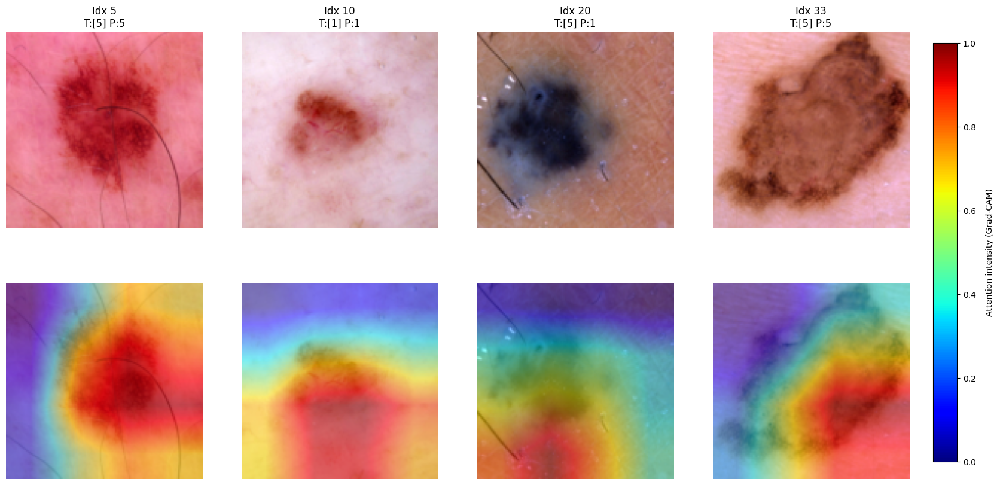

In [35]:
for row in all_results.itertuples():
    print(f"{row.img_size}, {row.loss_func}, {row.resnet}, {row.learning_rate}")
    h.run_gradcam_grid(row.model_obj, datasets_tr[row.img_size]['test'], [5, 10, 20, 33])

# h.run_gradcam_grid(resnet18_cbam, test_dataset, [5, 10, 20, 33])

In [ ]:
# best model is "128, unweighted, ResNet18, NaN: (iloc 4 in all df)
